In [333]:
import random
import numpy as np
import matplotlib.pyplot as plt
import copy

In [334]:
N = 50 #number of genes
P = 50 #population size
G = 2000 #number of generations
M = 0.03 #mutation rate


MIN_GENE = 0.0
MAX_GENE = 1.0
MUTESTEP = 0.1

In [335]:
population = []
offspring = []

crossover = []
mutate = []


total_utilities = {
    "origonal": 0.0,
    "gladiator": 0.0,
    "crosspoint": 0.0,
    "mutate": 0.0
}


best_fitness = np.zeros(G)
average_fitness = np.zeros(G)


In [336]:
class individual:
    def __init__(self):
        self.gene = [0]*N
        self.fitness = 0 

In [337]:
def test_function( ind ):
    utility= 0.0
    for i in range(N):
        utility = utility + ind.gene[i]
    return utility

In [338]:
def test_all(pop):
    total_utility = 0
    for i in pop:
        total_utility = total_utility + test_function(i)

    average_utility = total_utility/len(pop)
    
    return average_utility



In [339]:
def graph_population(pop, name):
    data = np.array([])
    
    for po in pop:
        data = np.append(data, po.fitness)


    plt.plot(data)
    plt.title(name)
    plt.xlabel("Individual")
    plt.ylabel("Fitness")
    plt.show()
    plt.close()

In [340]:
def graph_averages():
    height = np.array([])
    average = np.array([])
    
    for i in best_fitness:
        height = np.append(height, i)
    
    for i in average_fitness:
        average = np.append(average, i)


    plt.plot(height, label="Best")
    plt.plot(average, label="Average")
    plt.legend()
    plt.title("Generational Fitness")


    plt.xlabel("Generation")
    plt.ylabel("Fitness")
    plt.show()
    plt.close()

In [341]:
for x in range (0, P):
    tempgene=[]
    for y in range (0, N):
        tempgene.append( random.uniform(MIN_GENE, MAX_GENE) )
    newind = individual()
    newind.gene = tempgene.copy()
    population.append(newind)



In [342]:
def get_height(pop):
    height = 0
    for i in pop:
        if i.fitness > height:
            height = i.fitness

    return height

In [343]:
def test_population(population, name):
    for pop in population:
        pop.fitness = test_function(pop)
        # print(pop.gene, " ", pop.fitness)
        total_utilities[name] = total_utilities[name] + pop.fitness

Generation  0
[0.5610714639339506, 0.07508825964380095, 0.8266497901067812, 0.568562814057825, 0.3503900455985909, 0.934827717247716, 0.6926513751840025, 0.5460513554056606, 0.25107976783003927, 0.03271510232525543, 0.5519069708252357, 0.9096583053279851, 0.9581112632151008, 0.41239322224486896, 0.3333123357359775, 0.32708873112031134, 0.9415961619538367, 0.22068970259629628, 0.27757391083086547, 0.7177755681189717, 0.8809527598382442, 0.00025521601607514377, 0.9083834097940469, 0.5314340455006045, 0.6664955771129238, 0.5585277990937711, 0.9396576130980169, 0.46012917025931765, 0.9975860720268866, 0.37156588198531815, 0.8505615037643897, 0.4557220395196139, 0.06917472598887553, 0.5260164430046584, 0.6755551461918163, 0.2898833080741544, 0.6411701443090638, 0.8262954266445929, 0.822362019940135, 0.23288912037403997, 0.7868078679847662, 0.7272648553827225, 0.4539013533691356, 0.88733589716283, 0.10878097190946279, 0.7204029044856026, 0.33678083668616665, 0.3970702856285656, 0.74679738306

[0.5784678029436403, 0.2795149809542874, 0.5449310896167486, 0.45300953064956134, 0.5285262123746086, 0.9906021071072895, 0.6958784555915757, 0.9858326055804062, 0.009099042606385721, 0.42369161027867064, 0.8045649620995698, 0.9544117038855547, 0.6618777140589023, 0.6915857507343777, 0.5699414019671837, 0.6844314152969129, 0.9256611540894475, 0.7096163940131066, 0.48421831414709615, 0.6283121362350091, 0.9708789442411185, 0.5024165154195431, 0.33781226838756384, 0.5536433127515401, 0.9812466490030647, 0.976816219035398, 0.836399622376616, 0.8112697880515397, 0.020316587315969636, 0.49818094431256255, 0.6508987717735795, 0.41772112333996614, 0.06315708179308355, 0.5326343998973303, 0.8146252443458049, 0.7907866182106232, 0.33420184714124623, 0.8001505112909623, 0.35741618419540566, 0.6338426342448945, 0.8274937943842784, 0.5386794110294668, 0.9708682794662954, 0.8725672213711323, 0.5661836904899624, 0.8774012478440687, 0.9133479644354682, 0.7800224535597724, 0.8424837766595326, 0.205097

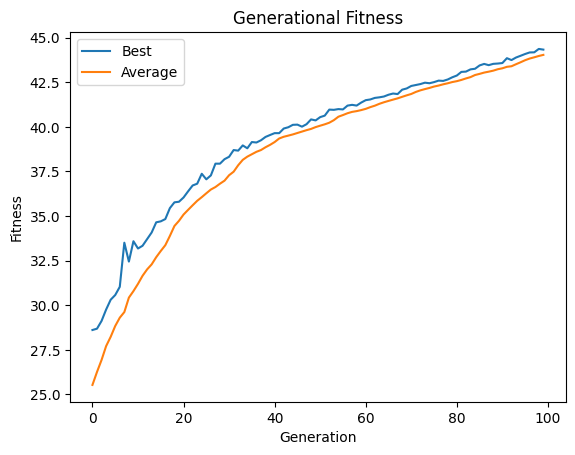

In [344]:
for g in range (0, G):



    print("Generation ", g)

## Test origonal population

    test_population(population, "origonal")
    
    
    
    



## init gladiator population
    
    for i in range (0, P):
        parent1 = random.randint( 0, P-1 )
        off1 = copy.deepcopy(population[parent1])
        parent2 = random.randint( 0, P-1 )
        off2 = copy.deepcopy(population[parent2])
        if off1.fitness > off2.fitness:
            offspring.append( off1 )
        else:
            offspring.append( off2 )

    ## test gladiator population
    
    test_population(offspring, "gladiator")



## create new copies to allow for easy transfer of data

    crossover = copy.deepcopy(offspring) 
    # mutate = copy.deepcopy(offspring)

## init crossover population

    toff1 = individual()
    toff2 = individual()
    temp = individual()
    for i in range( 0, P, 2 ):
        toff1 = copy.deepcopy(crossover[i])
        toff2 = copy.deepcopy(crossover[i+1])
        temp = copy.deepcopy(crossover[i])
        crosspoint = random.randint(1,N)

        for j in range (crosspoint, N):
            toff1.gene[j] = toff2.gene[j]
            toff2.gene[j] = temp.gene[j]
            
        crossover[i] = copy.deepcopy(toff1)
        crossover[i+1] = copy.deepcopy(toff2)

    ## test crossover population

    test_population(crossover, "crosspoint")




## init mutate population

    for i in range( 0, P ):
        newind = individual()
        newind.gene = []
        for j in range( 0, N ):
            gene = crossover[i].gene[j]
            mutprob = random.random()
            # print("muteprob: ", mutprob)
            if mutprob < M:
                alter = random.uniform(-MUTESTEP,MUTESTEP)
                gene = gene + alter
                if gene > MAX_GENE:
                    gene = MAX_GENE
                if gene < MIN_GENE:
                    gene = MIN_GENE

            newind.gene.append(gene)
            
        mutate.append(newind)

    ## test mutate population

    test_population(mutate, "mutate")

    


 ## calculate average fitness

    # test_population(population, "origonal")

    average_fitness[g] = total_utilities["origonal"] / P
    best_fitness[g] = get_height(population)



## DEBUGGING OPTIONS

    # graph_population(population, "Origonal")
    # graph_population(offspring, "Offspring Gladiator")
    # graph_population(crossover, "Offspring Crossover")
    # graph_population(mutate, "Offspring Mutation")

    print("Best fitness: ", best_fitness[g-1])
    print("Average fitness: ", average_fitness[g-1])
    print("Total utilities: ", total_utilities)

## copy most fit population to next generation


    # if (total_utilities["gladiator"] > total_utilities["crosspoint"]):
    #     if (total_utilities["gladiator"] > total_utilities["mutate"]):

    #         if (total_utilities["origonal"] > total_utilities["gladiator"]):
    #             population = copy.deepcopy(population)
    #             print("Origonal wins")
    #         else:
    #             population = copy.deepcopy(offspring)
    #             print("Gladiator wins")
    #     else:

    #         if (total_utilities["origonal"] > total_utilities["mutate"]):
    #             population = copy.deepcopy(population)
    #             print("Origonal wins")
    #         else:
    #             population = copy.deepcopy(mutate)
    #             print("Mutate wins")
    # else:
    #     if (total_utilities["crosspoint"] > total_utilities["mutate"]):
    #         if(total_utilities["origonal"] > total_utilities["crosspoint"]):
    #             population = copy.deepcopy(population)
    #             print("Origonal wins")
    #         else:
    #             population = copy.deepcopy(crossover)
    #             print("Crossover wins")
    #     else:
    #         if(total_utilities["origonal"] > total_utilities["mutate"]):
    #             population = copy.deepcopy(population)
    #             print("Origonal wins")
    #         else:
    #             population = copy.deepcopy(mutate)
    #             print("Mutate wins")



    if (total_utilities["mutate"] > total_utilities["origonal"]):
        population = copy.deepcopy(mutate)
        print("Mutate wins")
 
    ## calculate average fitness
    best_fitness[g] = get_height(population)
    average_fitness[g] = test_all(population)

   
    ## reset total utilities

    total_utilities = {
        "origonal": 0,
        "gladiator": 0,
        "crosspoint": 0,
        "mutate": 0
    }

    ## reset populations

    offspring = []
    crossover = []
    mutate = []



## graph average fitness

print("Best fitness: ", best_fitness)
print("Average fitness: ", average_fitness)
graph_averages()
    
